<font size="4"><b>Библиотеки для анализа геоданных</b></font>

<font size="3">__Базовые:__
- fiona
- shapely
- geopandas

__Обработка тематической информации__
- pysal
- geopy
- overpass
- osmnx

__Визуализация:__
- folium
- keplergl
- mapboxgl

</font>

In [116]:
import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon
import overpass
import folium

import pandas as pd
import numpy as np
from tqdm import tqdm_notebook
from urllib.parse import unquote

import warnings
warnings.filterwarnings('ignore')
import matplotlib
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10.0, 5.0)

### Create Shapely Point

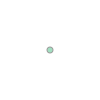

In [2]:
from shapely.geometry import Point
pnt = Point(50.079701, 53.181874)
pnt

<img src="data/img/poi_map.jpeg">

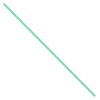

In [5]:
pnt2 = Point(50.21, 53.05)
test_line = LineString([pnt, pnt2])
test_line

<img src="data/img/highway_map.jpeg">

In [128]:
plgn = Polygon([[50.21, 53.05],[50.5, 53.4],[50.079701, 53.181874],[50.21, 53.05]])

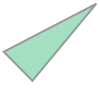

In [126]:
plgn

<img src="data/img/building_map.jpeg">

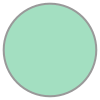

In [33]:
pnt.buffer(0.005)

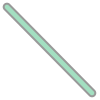

In [34]:
test_line.buffer(0.005)

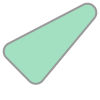

In [36]:
plgn.buffer(0.05)

### Load all poi in Samara using overpass

<img src="data/img/osm.jpeg">

<img src="data/img/osm_type.jpeg">

In [37]:
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import overpass

In [38]:
api = overpass.API(endpoint="https://overpass.kumi.systems/api/interpreter")
response = api.get('node["name"="Самара"]')

#show response 
response['features'][0]['properties']

{'addr:country': 'RU',
 'addr:region': 'Самарская область',
 'admin_level': '4',
 'alt_name:ar': 'سامارا',
 'alt_name:sk': 'Kujbyšev',
 'alt_name:sl': 'Kujbišev',
 'int_name': 'Samara',
 'is_in:country': 'Russia',
 'name': 'Самара',
 'name:ar': 'سمارا',
 'name:ba': 'Һамар',
 'name:be': 'Самара',
 'name:ca': 'Samara',
 'name:cs': 'Samara',
 'name:cv': 'Самар',
 'name:da': 'Samara',
 'name:de': 'Samara',
 'name:en': 'Samara',
 'name:es': 'Samara',
 'name:et': 'Samara',
 'name:fi': 'Samara',
 'name:fr': 'Samara',
 'name:hi': 'समारा',
 'name:hr': 'Samara',
 'name:hu': 'Szamara',
 'name:hy': 'Սամարա',
 'name:it': 'Samara',
 'name:ja': 'サマーラ',
 'name:ka': 'სამარა',
 'name:kn': 'ಸಮಾರ',
 'name:ko': '사마라',
 'name:lt': 'Samara',
 'name:oc': 'Samara',
 'name:pl': 'Samara',
 'name:pt': 'Samara',
 'name:ro': 'Samara',
 'name:ru': 'Самара',
 'name:sk': 'Samara',
 'name:sl': 'Samara',
 'name:uk': 'Самара',
 'name:zh': '薩馬拉',
 'official_status': 'ru:город',
 'old_name:1935-01-27--1991-01-25': 'Куйбыше

In [39]:
city_name = "Самара"

# Geocoding request via Nominatim
geolocator = Nominatim(user_agent="city_compare")
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)
geo_results = geocode(city_name, exactly_one=False, limit=3)

In [41]:
# Searching for relation in result set
for r in geo_results:
    print(r.address, r.raw.get("osm_type"))
    if r.raw.get("osm_type") == "relation":
        city = r
        break

# Calculating area id
area_id = int(city.raw.get("osm_id")) + 3600000000

# Excecuting overpass call
api = overpass.API(endpoint="https://overpass.kumi.systems/api/interpreter")
result = api.get("""
                 area(%s)->.searchArea;
                 (
                   node["shop"="supermarket"](area.searchArea);
                 );
                 """ % area_id)

Самара, городской округ Самара, Самарская область, Приволжский федеральный округ, 443028, Россия relation


### Create GeoDataFrame from overpass result

In [42]:
geom = [Point(x['geometry']['coordinates']) for x in result['features']]

poi = gpd.GeoDataFrame(data = [x['properties'] for x in result['features']],
                           geometry = geom)

poi[~poi['name'].isnull()].head()

,name,shop,alt_name,website,opening_hours,name:ru,alt_name:ru,brand,brand:wikidata,brand:wikipedia,...,addr:floor,payment:cards,payment:mastercard,payment:visa,payment:visa_electron,delivery,internet_access,toilets,wheelchair:description:ru,geometry
0,Октябрь,supermarket,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (50.27514 53.23344)
1,Пятёрочка,supermarket,Пятерочка,http://e5.ru/,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (50.17260 53.19980)
2,Пятёрочка,supermarket,NaN,NaN,Mo-Su 08:00-22:00,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (50.13785 53.20111)
3,Пчёлка,supermarket,NaN,http://pchelka63.ru/,Mo-Su 08:00-23:00,Пчёлка,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (50.16949 53.39012)
4,Сокол,supermarket,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (50.17075 53.38635)


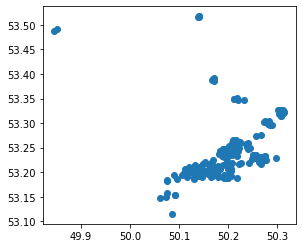

In [43]:
poi.plot();

In [44]:
poi.to_file('data/samara_supermarket.geojson', 'GeoJSON')

### Create GeoDataframe with target points

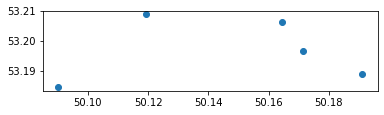

In [45]:
target_points = gpd.GeoDataFrame(geometry = [Point(x) for x in [(50.090123, 53.184626),
                                                                (50.164339, 53.206246),
                                                                (50.171537, 53.196687),
                                                                (50.191110, 53.188994),
                                                                (50.119346, 53.208805)]])
 
target_points['pnt_id'] = range(0, len(target_points))

target_points.plot();

### Extract coordinates from geometry column

In [46]:
poi['lon'] = poi.geometry.x
poi['lat'] = poi.geometry.y

#### Plot using geodata stored like dataframe

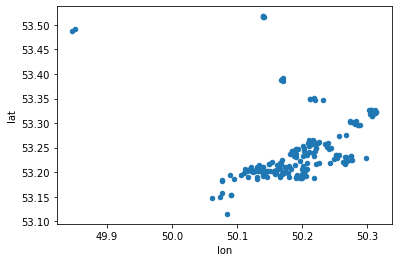

In [48]:
poi = pd.DataFrame(poi)

poi.plot(x = 'lon', y = 'lat', kind = 'scatter');

### Create folium maps

In [49]:
import folium
from folium.plugins import HeatMap

#### Map with markers

In [50]:
m = folium.Map(location=[53.193872, 50.116110], 
               zoom_start=13,
               tiles='cartodbpositron')

for lat, lon in zip(poi['lat'], poi['lon']):
    folium.Marker(
        location=[lat, lon]).add_to(m)

m


#### Create heatmap using folium

In [51]:
poi['lat'] = poi['lat'].astype(float)
poi['lon'] = poi['lon'].astype(float)

df_for_heatmap = poi[['lat', 'lon']]

df_for_heatmap = df_for_heatmap.dropna(axis=0, 
                                       subset=['lat','lon'])
heat_data = [[row['lat'],row['lon']] for index, row in df_for_heatmap.iterrows()]

In [53]:
m = folium.Map(location=[53.193872, 50.116110], 
               zoom_start=13, weight = 1000, height = 500,
               tiles='cartodbpositron')

HeatMap(heat_data,radius=20).add_to(m)

m

### Geocoding house data

In [59]:
ref = pd.read_csv('data/export-reestrmkd-63-20200901.csv', sep = ';')

In [108]:
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

geolocator = Nominatim(user_agent="city_compare")
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)
geo_results = geocode(city_name, exactly_one=False, limit=3)

In [110]:
location = geocode("Москва, Оружейный переулок 41")
print(location.address)
print((location.latitude, location.longitude))

Сбербанк, 41, Оружейный переулок, 49, Сущёво, Центральный административный округ, Москва, Центральный федеральный округ, 127006, Россия
(55.7732997, 37.6057714)


In [117]:
import requests
import pandas as pd

def geocoding_ya(address, api, ida):

    url = 'https://geocode-maps.yandex.ru/1.x/?apikey={}&format=json&geocode={}'.format(api, address)
    out = requests.get(url,  verify=False).json() #proxies=proxyDict,
    
    if len(out['response']['GeoObjectCollection']['featureMember'])==0:
        lon = None
        lat = None
    else:
        coords = out['response']['GeoObjectCollection']['featureMember'][0]['GeoObject']['Point']['pos']
        lon = coords.split(' ')[0]
        lat = coords.split(' ')[1]
        
    result = pd.DataFrame({'id': [ida], 
                           'address': [address], 
                           'lon':[lon],
                           'lat': [lat]})
        
    return result

In [121]:
api = '---'

In [122]:
address = 'Москва, Ленинский проспкт 93'

In [123]:
url = 'https://geocode-maps.yandex.ru/1.x/?apikey={}&format=json&geocode={}'.format(api, address)
out = requests.get(url,  verify=False).json()
out

{'response': {'GeoObjectCollection': {'metaDataProperty': {'GeocoderResponseMetaData': {'request': 'Москва, Ленинский проспкт 93',
     'results': '10',
     'suggest': 'Москва, Ленинский просп<fix>е</fix>кт 93',
     'found': '1'}},
   'featureMember': [{'GeoObject': {'metaDataProperty': {'GeocoderMetaData': {'precision': 'exact',
        'text': 'Россия, Москва, Ленинский проспект, 93',
        'kind': 'house',
        'Address': {'country_code': 'RU',
         'formatted': 'Россия, Москва, Ленинский проспект, 93',
         'postal_code': '119313',
         'Components': [{'kind': 'country', 'name': 'Россия'},
          {'kind': 'province', 'name': 'Центральный федеральный округ'},
          {'kind': 'province', 'name': 'Москва'},
          {'kind': 'locality', 'name': 'Москва'},
          {'kind': 'street', 'name': 'Ленинский проспект'},
          {'kind': 'house', 'name': '93'}]},
        'AddressDetails': {'Country': {'AddressLine': 'Россия, Москва, Ленинский проспект, 93',
      

In [124]:
geocoding_ya(address, api, 0)

,id,address,lon,lat
0,0,"Москва, Ленинский проспкт 93",37.52792,55.67524


In [63]:
df = ref[ref.formalname_city == 'Самара'].reset_index(drop=True)

In [ ]:
for x in tqdm_notebook(range(len(df))):
    try:
        location = geocode(df.address[x])
        df.longitude[x] = location.longitude
        df.latitude[x] = location.latitude
    except AttributeError:
        print('No results')

In [157]:
df_geocoded = gpd.read_file('data/samara_reformagkh.geojson')

In [158]:
m = folium.Map(location=[53.193872, 50.116110], 
               zoom_start=13, 
               weight = 1000, 
               height = 500,
               tiles='cartodbpositron')

for lat, lon in zip(df_geocoded['lat'], df_geocoded['lon']):
    folium.Circle(
        location=[lat, lon],
        radius=50,
        stroke=False,
        fill=True,
        fill_color='purple',
        fill_opacity=0.4
   ).add_to(m)

m

### Estimate population using reforma gkh

In [159]:
df['population'] = df['living_quarters_count']*2.6
df['population'] = df['population'].fillna(np.mean(df['population'].dropna()))
df.head(3)

,id,region_id,area_id,city_id,street_id,shortname_region,formalname_region,shortname_area,formalname_area,shortname_city,...,heating_type,hot_water_type,cold_water_type,sewerage_type,sewerage_cesspools_volume,gas_type,ventilation_type,firefighting_type,drainage_type,population
0,9369699,df3d7359-afa9-4aaa-8ff9-197e73906b1c,NaN,bb035cc3-1dc2-4627-9d25-a1bf2d4b936b,NaN,обл,Самарская,NaN,NaN,г,...,Не заполнено,Не заполнено,Не заполнено,Не заполнено,NaN,Не заполнено,Не заполнено,Не заполнено,Не заполнено,147.944111
1,9369697,df3d7359-afa9-4aaa-8ff9-197e73906b1c,NaN,bb035cc3-1dc2-4627-9d25-a1bf2d4b936b,NaN,обл,Самарская,NaN,NaN,г,...,Не заполнено,Не заполнено,Не заполнено,Не заполнено,NaN,Не заполнено,Не заполнено,Не заполнено,Не заполнено,147.944111
2,9369698,df3d7359-afa9-4aaa-8ff9-197e73906b1c,NaN,bb035cc3-1dc2-4627-9d25-a1bf2d4b936b,NaN,обл,Самарская,NaN,NaN,г,...,Не заполнено,Не заполнено,Не заполнено,Не заполнено,NaN,Не заполнено,Не заполнено,Не заполнено,Не заполнено,147.944111


### Aggregate population by city grid

In [160]:
city_grid = gpd.read_file('data/samara_grid500.geojson')
city_grid['plgn_id'] = range(0, len(city_grid))
city_grid.head(3)

,left,bottom,right,top,geometry,plgn_id
0,5.562661e+06,6.996627e+06,5.563161e+06,6.997127e+06,"MULTIPOLYGON (((5562661.016 6996627.115, 55626...",0
1,5.562661e+06,6.997127e+06,5.563161e+06,6.997627e+06,"MULTIPOLYGON (((5562661.016 6997127.115, 55626...",1
2,5.562661e+06,6.997627e+06,5.563161e+06,6.998127e+06,"MULTIPOLYGON (((5562661.016 6997627.115, 55626...",2


In [161]:
df_geocoded = pd.merge(df_geocoded, df, on = 'id', how = 'inner')

8870

In [162]:
df_geocoded = df_geocoded[['id', 'population','geometry']]
df_geocoded.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 8870 entries, 0 to 8869
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   id          8870 non-null   int64   
 1   population  8870 non-null   float64 
 2   geometry    8870 non-null   geometry
dtypes: float64(1), geometry(1), int64(1)
memory usage: 277.2 KB


In [163]:
city_grid = city_grid.to_crs(4326)

<img src=http://docs.qgis.org/testing/en/_images/overlay_operations.png>

In [164]:
sjoined = gpd.sjoin(df_geocoded, city_grid, how='inner')[['plgn_id', 'population']].\
              groupby('plgn_id').\
              sum().\
              reset_index()
sjoined.head()

,plgn_id,population
0,1712,174.2
1,1713,496.6
2,1714,712.4
3,1844,299.0
4,1845,312.0


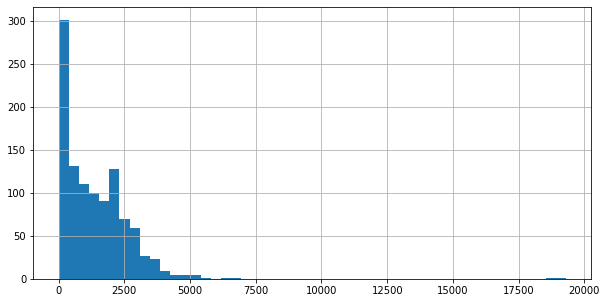

In [165]:
grid500 = pd.merge(city_grid, sjoined, on = 'plgn_id')

grid500.population.hist(bins = 50);

In [166]:
m = folium.Map(location=[53.193872, 50.116110], 
               zoom_start=13, weight = 1000, height = 500,
               tiles='cartodbpositron')
               
folium.Choropleth(
    geo_data=grid500,
    data=grid500,
    columns=['plgn_id','population'],
    key_on = 'feature.properties.plgn_id',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    bins = [0,1000, 3000, 5000, 10000, 20000],
    legend_name='Численность населения'
).add_to(m)

m

### Aggregate population by target area

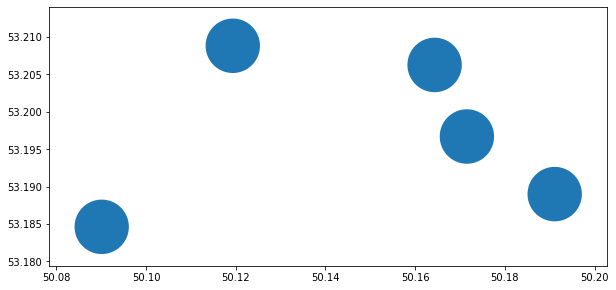

In [167]:
target_area = target_points.copy()
target_area.crs = {'init': 'epsg:4326'}
target_area = target_area.to_crs(epsg=32652)
target_area['geometry'] = target_area['geometry'].buffer(500)
target_area = target_area.to_crs(epsg=4326)
target_area.plot();

In [168]:
if target_area.crs != df_geocoded.crs:
    df_geocoded = df_geocoded.to_crs(target_area.crs)

In [169]:
sjoined_polygons = gpd.sjoin(df_geocoded, target_area)
grouped_by_data = sjoined_polygons[['pnt_id','population']].groupby('pnt_id').sum().reset_index()

target_area = pd.merge(target_area, grouped_by_data, on='pnt_id')

target_area.head()

,geometry,pnt_id,population
0,"POLYGON ((50.09156 53.18816, 50.09213 53.18806...",0,7467.835105
1,"POLYGON ((50.16579 53.20978, 50.16636 53.20968...",1,7214.744111
2,"POLYGON ((50.17299 53.20022, 50.17356 53.20012...",2,14625.552887
3,"POLYGON ((50.19256 53.19253, 50.19313 53.19242...",3,10110.376444
4,"POLYGON ((50.12079 53.21234, 50.12136 53.21224...",4,6449.576444


In [170]:
m = folium.Map(location=[53.193872, 50.116110], 
               zoom_start=13, weight = 1000, height = 500,
               tiles='cartodbpositron')
               
folium.Choropleth(
    geo_data=target_area,
    data=target_area,
    columns=['pnt_id','population'],
    key_on = 'feature.properties.pnt_id',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    bins=7,
    legend_name='Численность населения'
).add_to(m)

m

### Create isochrones

In [171]:
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
from descartes import PolygonPatch
from sklearn.neighbors import KDTree
from tqdm import tqdm

ox.config(log_console=True, use_cache=True)
ox.__version__

'0.14.1'

In [172]:
lon_min =  df_geocoded.geometry.x.min()
lon_max =  df_geocoded.geometry.x.max()
lat_min =  df_geocoded.geometry.y.min()
lat_max =  df_geocoded.geometry.y.max()

trip_times = [15] #in minutes
travel_speed = 4.5 #walking speed in km/hour

In [173]:
lat_max, lat_min, lon_max, lon_min

(53.959522, 52.40721, 50.473479, 49.369719)

#### Load graph using osmnx by bounds

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/osmnx/utils.py:67: UserWarning: The parameters ["timeout"] have been deprecated and will be removed in the next release. All of these parameters have been replaced by settings in the settings module, which you can set via ox.config(setting_name=value). Also note that the old custom_settings parameter has been renamed overpass_settings in the settings module.
  warn(msg)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/osmnx/plot.py:55: UserWarning: The fig_height, fig_width parameter(s) have been deprecated and will be removed in the next release. Note, fig_height and fig_width are replaced by the figsize parameter, use that instead. 
  warnings.warn(msg)


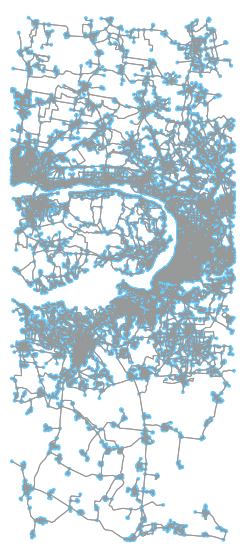

In [82]:
G_ = ox.graph_from_bbox(lat_max, lat_min, lon_max, lon_min,
                        timeout=120)

ox.plot_graph(G_, fig_height=10, fig_width=20);

#### Convert graph to geodataframe

In [83]:
gdf_nodes = ox.graph_to_gdfs(G_, edges=False)

tree = KDTree(gdf_nodes[['y', 'x']], metric='euclidean')

In [84]:
def make_iso_polys(G, edge_buff=0.0005, node_buff=0.0005, infill=False):
    isochrone_polys = []
    for trip_time in sorted(trip_times, reverse=True):
        subgraph = nx.ego_graph(G, closest_node_to_target, 
                                radius=trip_time, distance='time')

        node_points = [Point((data['x'],
                              data['y'])) for node, data in subgraph.nodes(data=True)]
        
        nodes_gdf = gpd.GeoDataFrame({'id': subgraph.nodes()}, 
                                     geometry=node_points)
        
        nodes_gdf = nodes_gdf.set_index('id')

        edge_lines = []
        for n_fr, n_to in subgraph.edges():
            f = nodes_gdf.loc[n_fr, 'geometry']
            t = nodes_gdf.loc[n_to, 'geometry']
            points = GeoSeries([f, t])
            edge_lines.append(LineString(points))

        n = nodes_gdf.buffer(node_buff).geometry
        e = gpd.GeoSeries(edge_lines).buffer(edge_buff).geometry
        all_gs = list(n) + list(e)
        new_iso = gpd.GeoSeries(all_gs).unary_union
        if infill:
            new_iso = Polygon(new_iso.exterior)
        isochrone_polys.append(new_iso)
    return isochrone_polys

In [85]:
from geopandas import GeoSeries

In [86]:
isochrone_polys = []
for x in tqdm(range(len(target_points))):
    
    target_pnt = target_points['geometry'][x].y, target_points['geometry'][x].x
    
    closest_idx = tree.query([target_pnt], k=1, return_distance=False)[0]

    closest_node_to_target = gdf_nodes.iloc[closest_idx].index.values[0]
    closest_node_to_target
    
    iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='Reds', start=0.3, return_hex=True)
    node_colors = {}
    for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
        subgraph = nx.ego_graph(G_, closest_node_to_target, radius=trip_time, distance='time')
        for node in subgraph.nodes():
            node_colors[node] = color

    nc = [node_colors[node] if node in node_colors else 'none' for node in G_.nodes()]
    ns = [20 if node in node_colors else 0 for node in G_.nodes()]

    isochrone_poly = make_iso_polys(G_, infill=True)
    isochrone_polys.append(isochrone_poly)

100%|██████████| 5/5 [00:16<00:00,  3.20s/it]


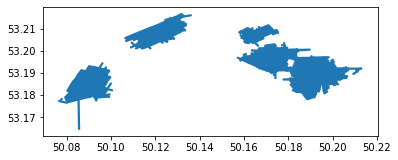

In [87]:
target_polys = target_points.copy()
target_polys['geometry'] = [x[0] for x in isochrone_polys]
target_polys.plot();

### Aggregate population by isochrones

In [88]:
if target_polys.crs != df_geocoded.crs:
    target_polys.crs = df_geocoded.crs

In [89]:
sjoined_polygons = gpd.sjoin(df_geocoded,target_polys)
grouped_by_data = sjoined_polygons[['pnt_id','population']].\
                                    groupby('pnt_id').\
                                    sum().\
                                    reset_index()

target_isochrones = pd.merge(target_polys, grouped_by_data, on='pnt_id')
target_isochrones.head()

,geometry,pnt_id,population
0,"POLYGON ((50.08615 53.16486, 50.08615 53.16484...",0,134186.821288
1,"POLYGON ((50.16687 53.20236, 50.16687 53.20234...",1,15130.761664
2,"POLYGON ((50.17473 53.18780, 50.17473 53.18779...",2,44487.699771
3,"POLYGON ((50.18868 53.17775, 50.18867 53.17774...",3,47593.123327
4,"POLYGON ((50.11437 53.20062, 50.11436 53.20062...",4,27540.940880


In [90]:
m = folium.Map(location=[53.193872, 50.116110], 
               zoom_start=13, weight = 1000, height = 500,
               tiles='cartodbpositron')
               
folium.Choropleth(
    geo_data=target_isochrones,
    data=target_isochrones,
    columns=['pnt_id','population'],
    key_on = 'feature.properties.pnt_id',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    bins=7,
    legend_name='Численность населения'
).add_to(m)

m

### Aggregate poi by isochrones

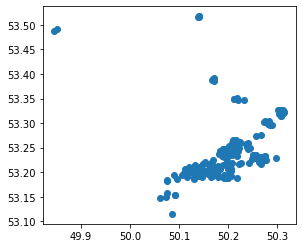

In [91]:
poi = gpd.GeoDataFrame(poi)
poi.plot();

In [92]:
poi.crs = target_polys.crs

poi['poi_id'] = range(0, len(poi))

In [93]:
sjoined_polygons = gpd.sjoin(poi,target_polys, how='left')
grouped_by_data = sjoined_polygons[['pnt_id','poi_id']].\
                                    groupby('pnt_id').\
                                    count().\
                                    reset_index()

target_isochrones_poi = pd.merge(target_polys, grouped_by_data, on='pnt_id', how='left')
target_isochrones_poi['poi_id'] = target_isochrones_poi['poi_id'].fillna(0)
target_isochrones_poi.head()

,geometry,pnt_id,poi_id
0,"POLYGON ((50.08615 53.16486, 50.08615 53.16484...",0,1
1,"POLYGON ((50.16687 53.20236, 50.16687 53.20234...",1,2
2,"POLYGON ((50.17473 53.18780, 50.17473 53.18779...",2,8
3,"POLYGON ((50.18868 53.17775, 50.18867 53.17774...",3,8
4,"POLYGON ((50.11437 53.20062, 50.11436 53.20062...",4,8


In [106]:
m = folium.Map(location=[53.193872, 50.116110], 
               zoom_start=13, weight = 1000, height = 500,
               tiles='cartodbpositron')
               
folium.Choropleth(
    geo_data=target_isochrones_poi,
    data=target_isochrones_poi,
    columns=['pnt_id','poi_id'],
    key_on = 'feature.properties.pnt_id',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    bins=7,
    legend_name='Число poi в пешей доступности'
).add_to(m)

m

### Export results

In [95]:
target_isochrones.to_file('data/samara_population_by_isochrones.geojson', 'GeoJSON')
target_isochrones_poi.to_file('data/samara_hairdressers_by_isochrones.geojson', 'GeoJSON')
grid500.to_file('data/samara_population_by_regular_grid.geojson', 'GeoJSON')

### Final map

In [102]:
target_isochrones_poi.head()

,geometry,pnt_id,poi_id
0,"POLYGON ((50.08615 53.16486, 50.08615 53.16484...",0,1
1,"POLYGON ((50.16687 53.20236, 50.16687 53.20234...",1,2
2,"POLYGON ((50.17473 53.18780, 50.17473 53.18779...",2,8
3,"POLYGON ((50.18868 53.17775, 50.18867 53.17774...",3,8
4,"POLYGON ((50.11437 53.20062, 50.11436 53.20062...",4,8


In [107]:
m = folium.Map(location=[53.193872, 50.116110], 
               zoom_start=13, weight = 1000, height = 600,
               tiles='cartodbpositron')

folium.Choropleth(
    geo_data=target_isochrones_poi,
    data=target_isochrones_poi,
    columns=['pnt_id','poi_id'],
    key_on = 'feature.properties.pnt_id',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    bins=7,
    legend_name='Число POI в пешей доступности'
).add_to(m)

for lat, lon in zip(df_geocoded.geometry.y, df_geocoded.geometry.x):
    folium.Circle(
        location=[lat, lon],
        radius=40,
        stroke=False,
        fill=True,
        fill_color='steelblue',
        fill_opacity=0.6
   ).add_to(m)

for lat, lon in zip(poi['lat'], poi['lon']):
    folium.Circle(
        location=[lat, lon],
        radius=50,
        stroke=False,
        fill=True,
        fill_color='red',
        fill_opacity=0.8
   ).add_to(m)

for lat, lon in zip(target_points.geometry.y, target_points.geometry.x):
    folium.Marker(
        location=[lat, lon],
        radius=50
   ).add_to(m)
    
m

### Create map using kepler gl

In [97]:
from keplergl import KeplerGl

In [98]:
#set map config
config = {
    'version': 'v1',
    'config': {
        'mapState': {
            'latitude': 53.193872,
            'longitude': 50.116110,
            'zoom': 13
        }
    }
}

In [131]:
map_1 = KeplerGl(config = config)

map_1.add_data(data = df_geocoded, name = 'Buildings')
map_1.add_data(data = target_isochrones, name = 'Isochrones')

map_1

User Guide: https://github.com/keplergl/kepler.gl/blob/master/docs/keplergl-jupyter/user-guide.md


KeplerGl(config={'version': 'v1', 'config': {'mapState': {'latitude': 53.193872, 'longitude': 50.11611, 'zoom'…

<font size="4"><b>Полезные ссылки</b></font>

<font size="4">- @start_ds</font> 

In [174]:
import pkg_resources
import types
def get_imports():
    for name, val in globals().items():
        if isinstance(val, types.ModuleType):
            # Split ensures you get root package, 
            # not just imported function
            name = val.__name__.split(".")[0]

        elif isinstance(val, type):
            name = val.__module__.split(".")[0]

        # Some packages are weird and have different
        # imported names vs. system/pip names. Unfortunately,
        # there is no systematic way to get pip names from
        # a package's imported name. You'll have to add
        # exceptions to this list manually!
        poorly_named_packages = {
            "PIL": "Pillow",
            "sklearn": "scikit-learn"
        }
        if name in poorly_named_packages.keys():
            name = poorly_named_packages[name]

        yield name
imports = list(set(get_imports()))

# The only way I found to get the version of the root package
# from only the name of the package is to cross-check the names 
# of installed packages vs. imported packages
requirements = []
for m in pkg_resources.working_set:
    if m.project_name in imports and m.project_name!="pip":
        requirements.append((m.project_name, m.version))

In [175]:
requirements

[('tqdm', '4.36.1'),
 ('scikit-learn', '0.22'),
 ('requests', '2.24.0'),
 ('pandas', '1.1.3'),
 ('overpass', '0.6.1'),
 ('osmnx', '0.14.1'),
 ('numpy', '1.19.2'),
 ('networkx', '2.5'),
 ('matplotlib', '3.3.2'),
 ('keplergl', '0.1.2'),
 ('geopy', '1.20.0'),
 ('geopandas', '0.8.1'),
 ('folium', '0.10.0'),
 ('autopep8', '1.4.4')]